# Importing Libraries

In [557]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sklearn.metrics as metrics

In [558]:
# To suppress warniings

import warnings
warnings.filterwarnings("ignore")

# Importing dataset

## Reading data

In [559]:
url = "https://raw.githubusercontent.com/anij715/AI-datascie-proj/main/PROJECT/weatherAUS.csv"
data = pd.read_csv(url)
df = pd.read_csv(url)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## Checking for datatypes and cell formats

In [560]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [561]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

# Data Cleaning

### Checking for missing values, NaN, null or any other anamolies

In [562]:
# For NA

print(df.isna().values.any())
print(df.isna().values.sum())
print(df.isna().sum())

True
343248
Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64


### Our Target variable is df['RainTomorrow']

Removing records in df[RainTomorrow] with missing values in our Target variable

In [563]:
df = df.dropna(subset=['RainTomorrow'])
print(df.isna().sum())

Date                 0
Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RainTomorrow         0
dtype: int64


In [564]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

Preprocessing Date

In [565]:
df['Date'] = pd.to_datetime(df['Date'])

# extract year from date
df['Year'] = df['Date'].dt.year

# extract month from date
df['Month'] = df['Date'].dt.month

# extract day from date
df['Day'] = df['Date'].dt.day

# drop the original Date variable
df.drop('Date', axis=1, inplace = True)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       142193 non-null  object 
 1   MinTemp        141556 non-null  float64
 2   MaxTemp        141871 non-null  float64
 3   Rainfall       140787 non-null  float64
 4   Evaporation    81350 non-null   float64
 5   Sunshine       74377 non-null   float64
 6   WindGustDir    132863 non-null  object 
 7   WindGustSpeed  132923 non-null  float64
 8   WindDir9am     132180 non-null  object 
 9   WindDir3pm     138415 non-null  object 
 10  WindSpeed9am   140845 non-null  float64
 11  WindSpeed3pm   139563 non-null  float64
 12  Humidity9am    140419 non-null  float64
 13  Humidity3pm    138583 non-null  float64
 14  Pressure9am    128179 non-null  float64
 15  Pressure3pm    128212 non-null  float64
 16  Cloud9am       88536 non-null   float64
 17  Cloud3pm       85099 non-null

In [566]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


Now, I segregate the dataset into categorical and numerical variables.

In [567]:
categorical = [var for var in df.columns if df[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :', categorical)

There are 6 categorical variables

The categorical variables are : ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


### Dealing with missing values in categorial variables

In [568]:
# print categorical variables containing missing values

cat1 = [var for var in categorical if df[var].isnull().sum()!=0]

print(df[cat1].isnull().sum())

WindGustDir     9330
WindDir9am     10013
WindDir3pm      3778
RainToday       1406
dtype: int64


High cardinality may pose some serious problems in the machine learning model. So, I will check for high cardinality.

In [569]:
# check for cardinality in categorical variables

for var in categorical:
    
    print(var, ' contains ', len(df[var].unique()), ' labels')

Location  contains  49  labels
WindGustDir  contains  17  labels
WindDir9am  contains  17  labels
WindDir3pm  contains  17  labels
RainToday  contains  3  labels
RainTomorrow  contains  2  labels


If the number of missing values in a category are less than 10% and other classes are normally distributed then replace missing values with mode of the variable. But if the number of missing values are high then its better to treat it as one more value in that category.

Here, we have missing values in four categorial variables (excluding 'RainTomorrow' sice it's the target variable):

* WindGustDir
* WindDir9am
* WindDir3pm
* RainToday

In [570]:
per1 = (df['WindGustDir'].isnull().sum()/df['WindGustDir'].count())*100
print('Missing values in WindGustDir =', per1, '%')

Missing values in WindGustDir = 7.022271061168271 %


In [571]:
per2 = (df['WindDir9am'].isnull().sum()/df['WindDir9am'].count())*100
print('Missing values in WindDir9am =', per2, '%')

Missing values in WindDir9am = 7.57527613859888 %


In [572]:
per3 = (df['WindDir3pm'].isnull().sum()/df['WindDir3pm'].count())*100
print('Missing values in WindDir3pm =', per3, '%')

Missing values in WindDir3pm = 2.7294729617454756 %


In [573]:
per4 = (df['RainToday'].isnull().sum()/df['RainToday'].count())*100
print('Missing values in RainToday =', per4, '%')

Missing values in RainToday = 0.9986717523634994 %


All of their missing values are less than 10% of total records, hence I will replace the missing values with their respective mode value.

In [574]:
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])
print(df.isna().sum())

Location             0
MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir          0
WindGustSpeed     9270
WindDir9am           0
WindDir3pm           0
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday            0
RainTomorrow         0
Year                 0
Month                0
Day                  0
dtype: int64


Now we don't have missing values in categorial variables anymore

Encoding Categorial variables

In [575]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()  

df['Location']= label_encoder.fit_transform(df['Location'])  
df['WindGustDir']= label_encoder.fit_transform(df['WindGustDir'])  
df['WindDir9am']= label_encoder.fit_transform(df['WindDir9am'])  
df['WindDir3pm']= label_encoder.fit_transform(df['WindDir3pm'])
df['RainToday']= label_encoder.fit_transform(df['RainToday'])
df['RainTomorrow']= label_encoder.fit_transform(df['RainTomorrow']) 
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2,13.4,22.9,0.6,NaN,NaN,13,44.0,13,14,...,1007.1,8.0,NaN,16.9,21.8,0,0,2008,12,1
1,2,7.4,25.1,0.0,NaN,NaN,14,44.0,6,15,...,1007.8,NaN,NaN,17.2,24.3,0,0,2008,12,2
2,2,12.9,25.7,0.0,NaN,NaN,15,46.0,13,15,...,1008.7,NaN,2.0,21.0,23.2,0,0,2008,12,3
3,2,9.2,28.0,0.0,NaN,NaN,4,24.0,9,0,...,1012.8,NaN,NaN,18.1,26.5,0,0,2008,12,4
4,2,17.5,32.3,1.0,NaN,NaN,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,2008,12,5


### Dealing with missing values in numerical variables

We will replace missing values with the respective column median. I am not using random forest or mean replacement method because median method better deals with the outliers.

Also, if we skip all records with missing value, it will reduce the size of the dataset by a significant margin which might be problematic if we want to scale the model to big data in future.

In [576]:
for df_2 in [df]:
    for col in df.columns:
        col_median=df[col].median()
        df_2[col].fillna(col_median, inplace=True) 
print(df_2.isna().sum())

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64


There are no missing values in the dataset

In [577]:
df = df_2
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2,13.4,22.9,0.6,4.8,8.5,13,44.0,13,14,...,1007.1,8.0,5.0,16.9,21.8,0,0,2008,12,1
1,2,7.4,25.1,0.0,4.8,8.5,14,44.0,6,15,...,1007.8,5.0,5.0,17.2,24.3,0,0,2008,12,2
2,2,12.9,25.7,0.0,4.8,8.5,15,46.0,13,15,...,1008.7,5.0,2.0,21.0,23.2,0,0,2008,12,3
3,2,9.2,28.0,0.0,4.8,8.5,4,24.0,9,0,...,1012.8,5.0,5.0,18.1,26.5,0,0,2008,12,4
4,2,17.5,32.3,1.0,4.8,8.5,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,41,3.5,21.8,0.0,4.8,8.5,0,31.0,2,0,...,1021.2,5.0,5.0,9.4,20.9,0,0,2017,6,20
145455,41,2.8,23.4,0.0,4.8,8.5,0,31.0,9,1,...,1020.3,5.0,5.0,10.1,22.4,0,0,2017,6,21
145456,41,3.6,25.3,0.0,4.8,8.5,6,22.0,9,3,...,1019.1,5.0,5.0,10.9,24.5,0,0,2017,6,22
145457,41,5.4,26.9,0.0,4.8,8.5,3,37.0,9,14,...,1016.8,5.0,5.0,12.5,26.1,0,0,2017,6,23


### Finding Corelation 

In [578]:
# Def high_val and low_val
num_val = df[([var for var in df.columns if df[var].dtype==float])]
cat_val = df[(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday','RainTomorrow'])]

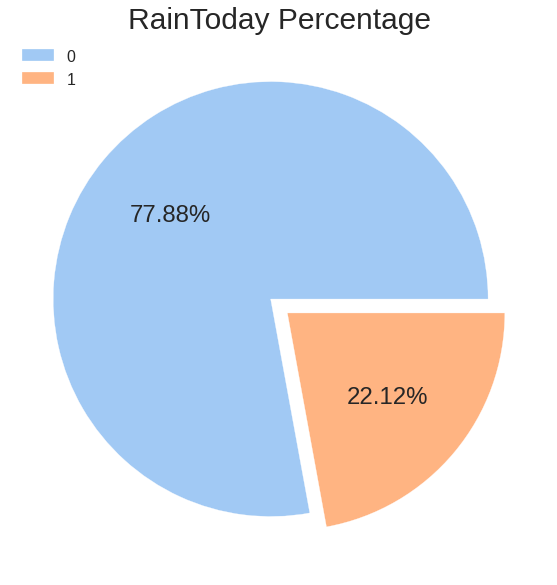

In [579]:
# Rank Product by Customer Favorite
sns.set(font_scale=2)
plt.style.use('seaborn')
plt.figure(figsize=(10,10))
colors = sns.color_palette('pastel')

plt.pie(cat_val['RainToday'].value_counts().values, explode= (0.05,0.05), colors = colors,
        autopct='%.2f%%')
plt.title("RainToday Percentage", size = 30)
plt.legend(cat_val['RainToday'].unique(), loc='upper left', prop={'size': 16})

plt.show()

Here we can see that their is low probability of having rain today (date when the observation war recorded).

Distribution of the features:

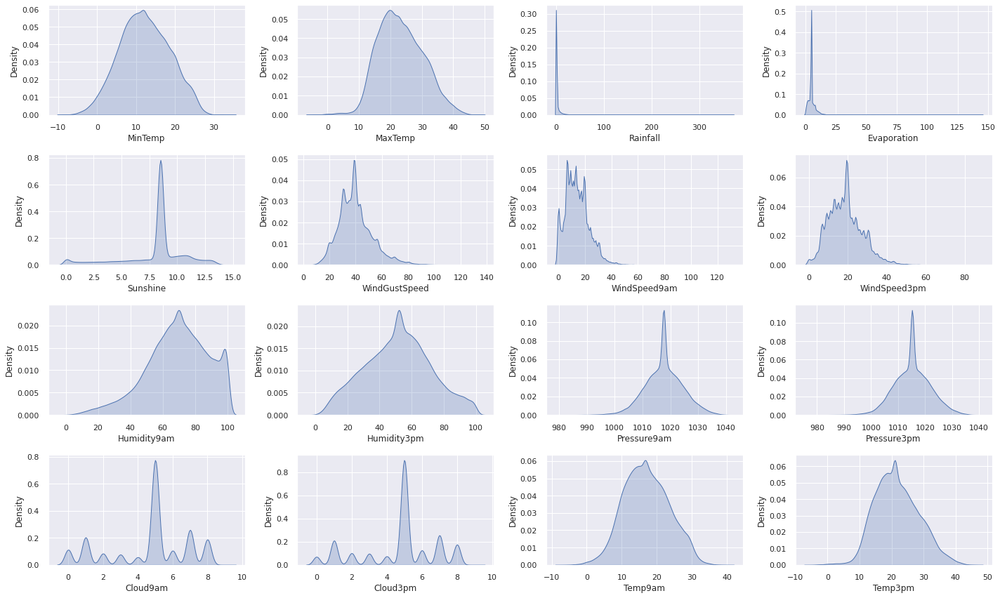

In [580]:
sns.set(font_scale=1)
fig = plt.figure(figsize=(20, 12), constrained_layout=False)
for i in range(len(num_val.columns)):
    plt.subplot(4, 4, i+1)
    plt.tight_layout()
    sns.kdeplot(data=num_val, x=num_val[num_val.columns[i]], shade=True)


Key Points:

* MinTemp, MaxTemp, Temp9am, Temp3pm have normal distributions.


Relation of RainToday with Numerical variables:

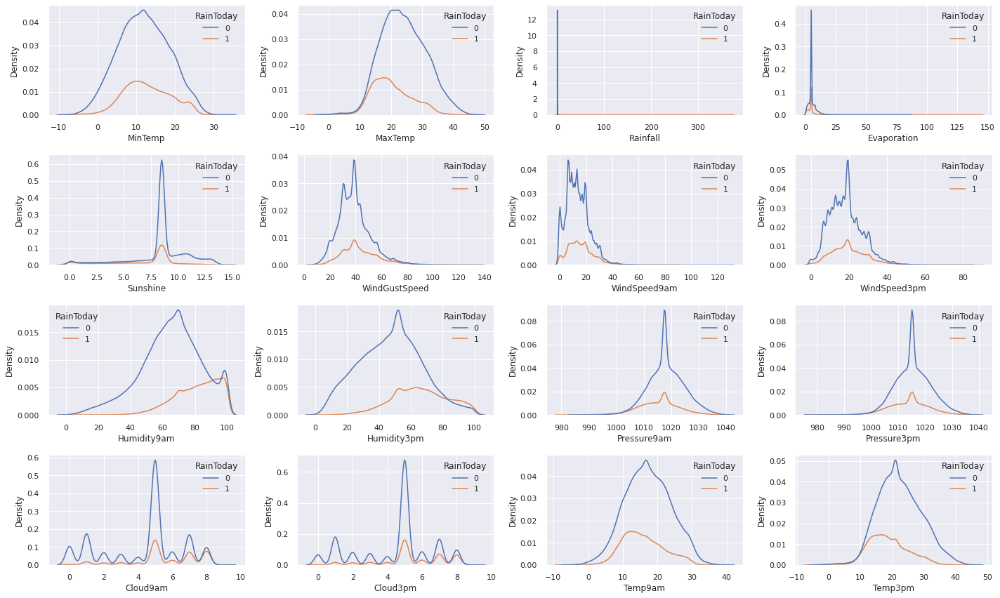

In [581]:
sns.set(font_scale=1)
fig = plt.figure(figsize=(20, 12), constrained_layout=False)
for i in range(len(num_val.columns)):
    plt.subplot(4, 4, i+1)
    plt.tight_layout()
    sns.kdeplot(data=num_val, x=num_val[num_val.columns[i]], hue=cat_val['RainToday'])


Relation of RainTomorrow with Numerical variables:

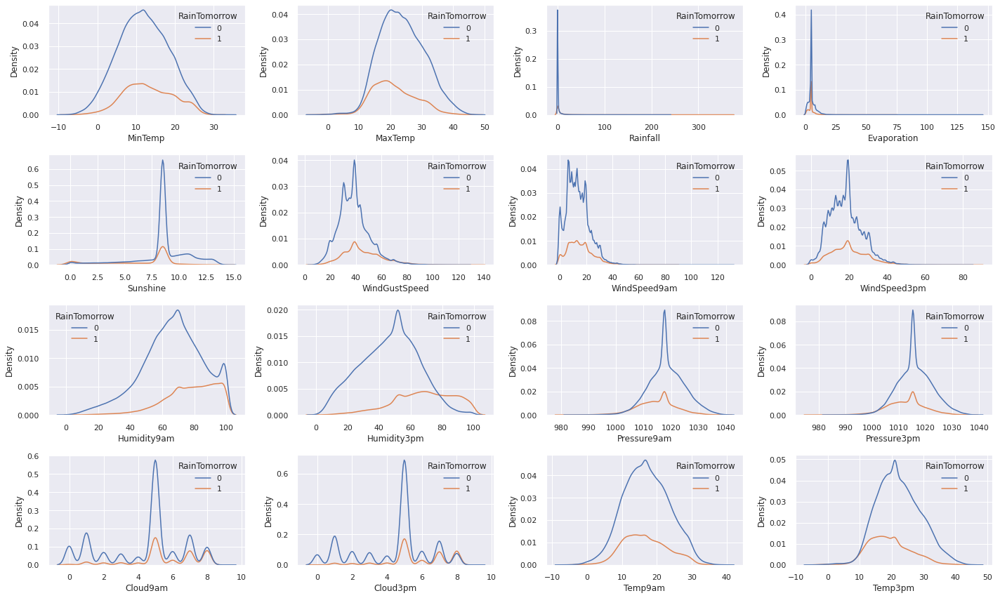

In [582]:
# Graph each variable with target
sns.set(font_scale=1)
fig = plt.figure(figsize=(20, 12), constrained_layout=False)
for i in range(len(num_val.columns)):
    plt.subplot(4, 4, i+1)
    plt.tight_layout()
    sns.kdeplot(data=num_val, x=num_val[num_val.columns[i]], hue=cat_val['RainTomorrow'])


Heatmap

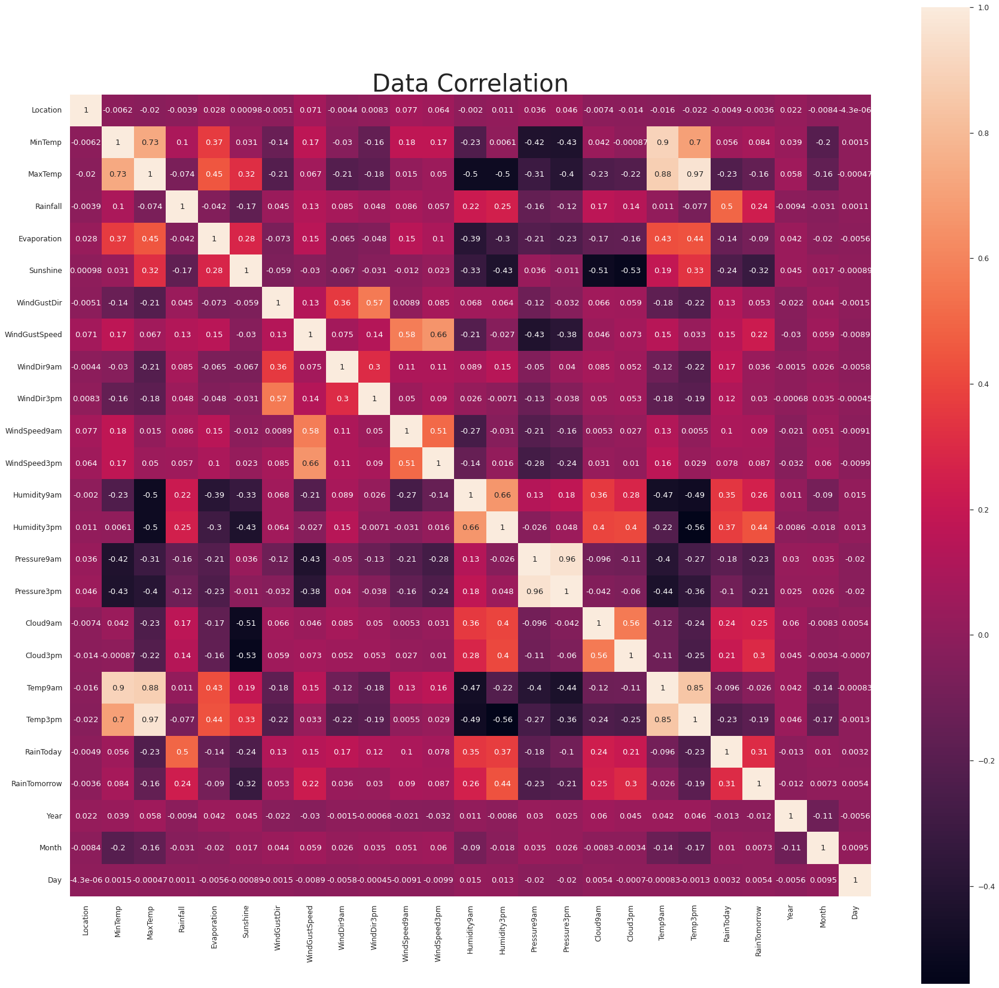

In [583]:
# Data Correlation with heatmap

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=1.1)

corr = df.corr()
sns.heatmap(corr,annot=True, square=True)
plt.title("Data Correlation", size = 40)
plt.show()

As we can see that our dataset had a strong correlation for features:
* MaxTemp with MinTemp
* Temp9am with MaxTemp, MinTemp, Temp3pm and viceversa.
* Pressure9am with Pressure3pm.

### Feature Selection

Dropping - MinTemp, Temp3pm, and Pressure3pm

In [584]:
df.drop('MinTemp', axis=1, inplace = True)
df.drop('Temp3pm', axis=1, inplace = True)
df.drop('Pressure3pm', axis=1, inplace = True)

Let's look at the correlation once again

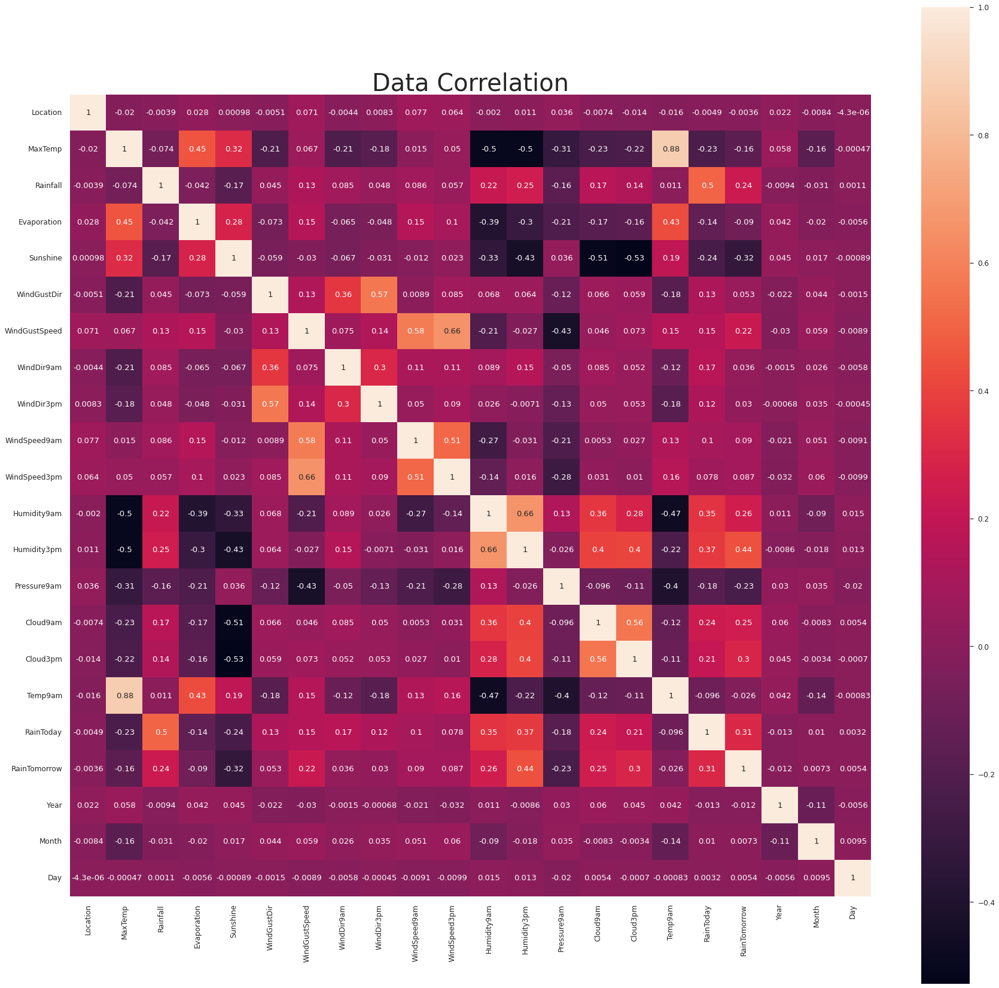

In [585]:
corr = df.corr()
sns.heatmap(corr,annot=True, square=True)
plt.title("Data Correlation", size = 40)
plt.show()

Temp9am and MaxTemp has high correlation, let's drop MaxTemp as well.

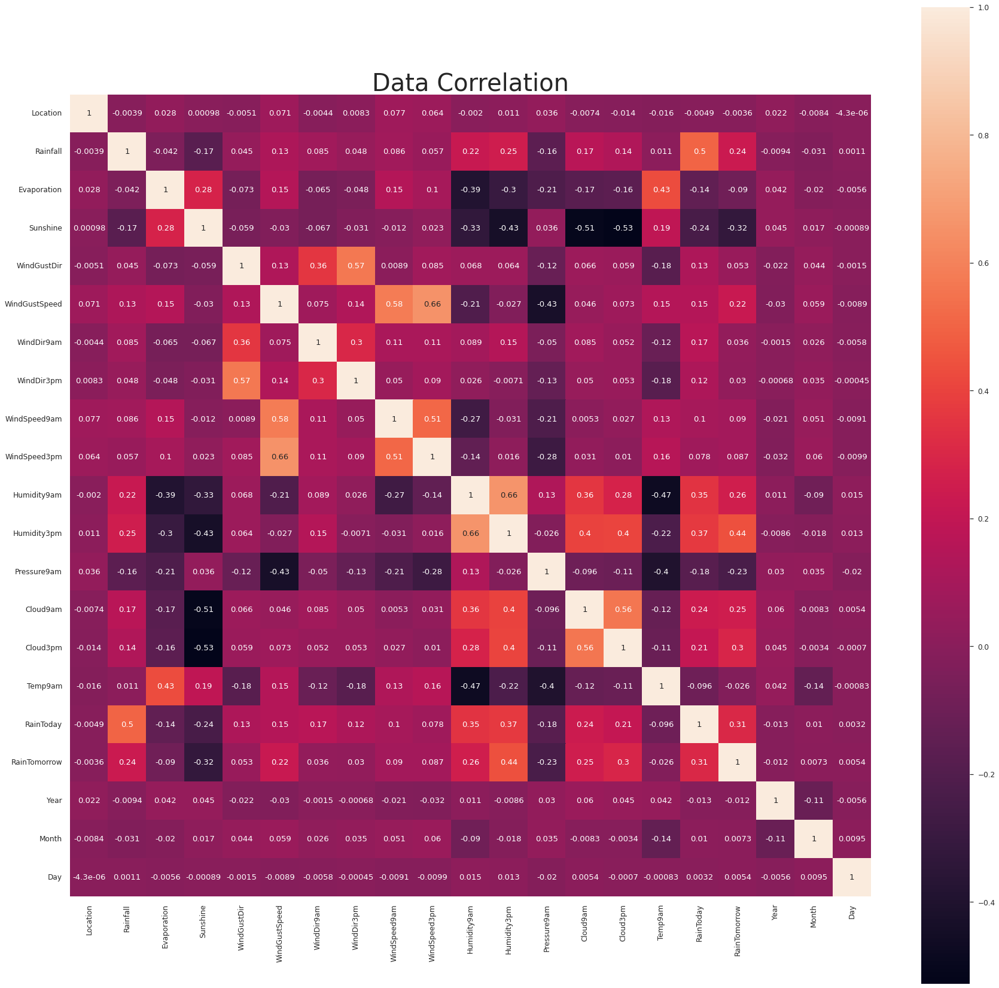

In [586]:
df.drop('MaxTemp', axis=1, inplace = True)
corr = df.corr()
sns.heatmap(corr,annot=True, square=True)
plt.title("Data Correlation", size = 40)
plt.show()

SELECTED FEATURES: 'Location', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'RainToday', 'Year', 'Month', 'Day'

TARGET VARIABLE: 'RainTomorrow'

In [587]:
X = df.drop(['RainTomorrow'], axis=1)
Y = df['RainTomorrow']

In [588]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)
print(X_train.shape, X_test.shape)
print(Y_train.shape, Y_test.shape)

(99535, 20) (42658, 20)
(99535,) (42658,)


### Feature Scaling

In [589]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_ = scaler.fit_transform(X_train)
X_test_ = scaler.transform(X_test)

cols = X.columns

X_train = pd.DataFrame(X_train_, columns=[cols])
X_test = pd.DataFrame(X_test_, columns=[cols])

Here we used MinMaxScaler because it transforms data by scaling features to a given range. It scales the values to a specific value range without changing the shape of the original distribution.

In [590]:
X_train

,Location,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,Temp9am,RainToday,Year,Month,Day
0,0.645833,0.000000,0.016552,0.668966,0.733333,0.100775,0.200000,0.533333,0.000000,0.132530,0.74,0.38,0.766942,0.125,0.000000,0.398734,0.0,0.2,0.545455,1.000000
1,0.541667,0.000539,0.033103,0.586207,1.000000,0.193798,0.933333,0.866667,0.053846,0.132530,0.81,0.39,0.464463,0.625,0.555556,0.512658,0.0,0.4,0.818182,0.266667
2,0.312500,0.005930,0.023448,0.765517,0.800000,0.271318,0.400000,0.600000,0.146154,0.108434,0.55,0.41,0.623140,0.625,0.555556,0.335443,1.0,0.4,0.818182,0.800000
3,0.604167,0.000000,0.033103,0.393103,0.133333,0.410853,0.000000,0.133333,0.230769,0.337349,0.35,0.20,0.520661,0.625,0.555556,0.622363,0.0,0.3,1.000000,0.600000
4,0.020833,0.000000,0.037241,0.889655,0.866667,0.255814,0.000000,0.600000,0.030769,0.228916,0.80,0.52,0.578512,0.000,0.555556,0.594937,0.0,0.9,0.090909,0.133333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99530,0.958333,0.033962,0.033103,0.586207,0.866667,0.286822,0.933333,0.866667,0.153846,0.180723,0.70,0.52,0.611570,0.625,0.555556,0.485232,1.0,0.5,0.727273,0.000000
99531,0.645833,0.008086,0.008276,0.158621,0.800000,0.255814,0.800000,0.866667,0.015385,0.156627,0.90,0.55,0.621488,0.875,0.777778,0.476793,1.0,0.7,0.727273,0.266667
99532,1.000000,0.000000,0.082759,0.896552,0.733333,0.294574,0.733333,0.666667,0.200000,0.180723,0.41,0.21,0.581818,0.000,0.000000,0.474684,0.0,0.3,1.000000,0.633333
99533,0.354167,0.000000,0.033103,0.586207,0.133333,0.255814,0.666667,0.600000,0.146154,0.265060,0.75,0.79,0.613223,1.000,0.444444,0.485232,0.0,0.7,0.909091,0.133333


# PROBLEM STATEMENT

* This is a classification problem.
* Label is 'RainTomorrow' variable.
* We have to train a model which can predict if it will rain tomorrow or not based on given features.
* For this, we will train different classification models and compare their performance.
* Evaluation metrics will be Accuracy score & F1 score.
* I will also do K-Means clustering to explore and the fit a classifier to build an ensemble.
* We will use n=2 clusters.
* I will also use SOM ensemble with Logistic regression and then with MLP clasifier.


# Supervised Modelling

The classifiers I chose:

* Logistic Regression
* Linear Classifier (Stochastic Gradient Descent)
* Multi-layer Perceptron Classifier 

## MODEL 1 - LOGISTIC REGRESSION

### Model training

In [591]:
from sklearn.linear_model import LogisticRegression

# instantiate the model
logreg = LogisticRegression(solver='saga', random_state=42)

# fit the model
logreg.fit(X_train, Y_train)

LogisticRegression(random_state=42, solver='saga')

NOTE:  We chose solver = ‘saga’ because is is faster for large dataset. Also, ‘saga’ fast convergence is only guaranteed on features with approximately the same scale. We already have used MinMax Scaler for feature scaling.

### Predict results 

In [592]:
Y_pred_test_LoR = logreg.predict(X_test)
Y_pred_train_LoR = logreg.predict(X_train)

Check Accuracy

In [593]:
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score
print('Model 2 Testing-set accuracy score is {0:0.4f}'. format(accuracy_score(Y_test, Y_pred_test_LoR)))

Model 2 Testing-set accuracy score is 0.8391


NOTE: Here, Y_test_1 are the true class labels and Y_pred_test_1 are the predicted class labels in the test-set.

Compare the train-set and test-set accuracy

In [594]:
print('Model 2 Training-set accuracy score is {0:0.4f}'. format(accuracy_score(Y_train, Y_pred_train_LoR)))

Model 2 Training-set accuracy score is 0.8409


Check for overfitting

In [595]:
print('Training set Acuracy score: {:.4f}'.format(logreg.score(X_train, Y_train)))

print('Test set Acuracy score: {:.4f}'.format(logreg.score(X_test, Y_test)))

Training set Acuracy score: 0.8409
Test set Acuracy score: 0.8391


The training-set accuracy score and the test-set accuracy values are quite comparable. So, there is no question of overfitting.

In [596]:
print('Test set F1 score: ',f1_score(Y_test, Y_pred_test_LoR))

Test set F1 score:  0.571142910704243


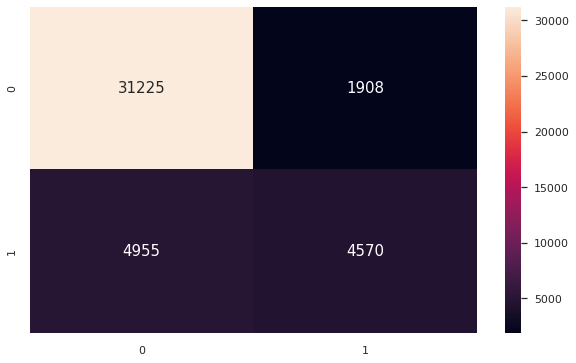

In [597]:
sns.set(rc={'figure.figsize':(10,6)})
cmLoR = metrics.confusion_matrix(Y_test, Y_pred_test_LoR)
sns.heatmap(cmLoR, annot=True, fmt='.5g', annot_kws={"size": 15})

In the example below, the first item in that list is the probability that this observation belongs to class 0, and the second list item is the probability this this observation belongs to class 1.

In [598]:
logreg.predict_proba(X_train)[0]

array([0.99016915, 0.00983085])

In [599]:
logreg.predict_proba(X_test)

array([[0.10181866, 0.89818134],
       [0.72788316, 0.27211684],
       [0.987856  , 0.012144  ],
       ...,
       [0.84948161, 0.15051839],
       [0.44511162, 0.55488838],
       [0.81733571, 0.18266429]])

I want to create a single array of just the probabilities that our model predicts in which each of the observations from our training data belongs to class 1.

In [600]:
X_train_probability_class_1 = logreg.predict_proba(X_train)[:, 1]
X_train_probability_class_1[0]

0.00983084770991924

### Visualizing plots

Observing how test features individually co-relate to the target.

Text(0, 0.5, 'Rain Tomorrow')

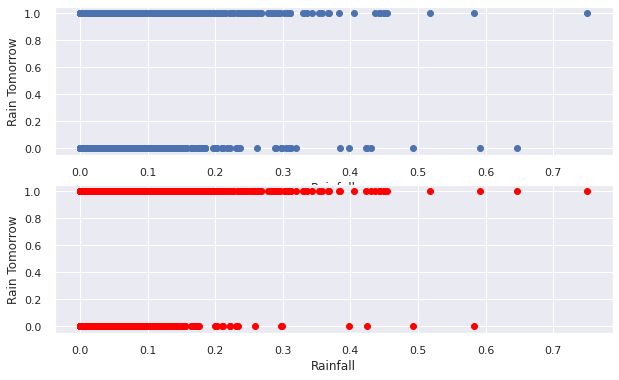

In [601]:
plt.subplot(211)
plt.scatter(X_test['Rainfall'],Y_test)
plt.xlabel('Rainfall')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Rainfall'],Y_pred_test_LoR,color='red')
plt.xlabel('Rainfall')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

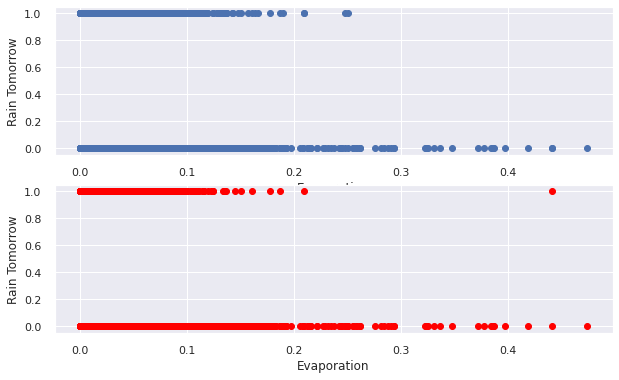

In [602]:
plt.subplot(211)
plt.scatter(X_test['Evaporation'],Y_test)
plt.xlabel('Evaporation')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Evaporation'],Y_pred_test_LoR,color='red')
plt.xlabel('Evaporation')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

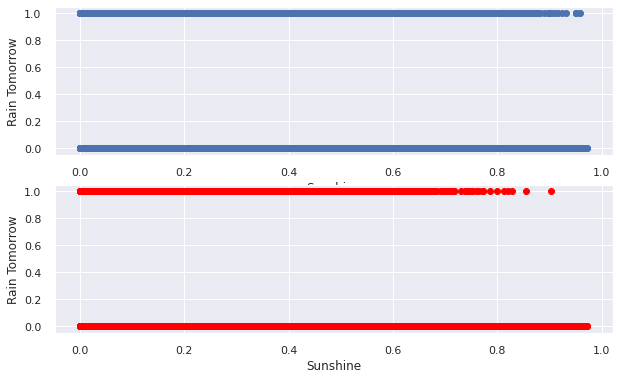

In [603]:
plt.subplot(211)
plt.scatter(X_test['Sunshine'],Y_test)
plt.xlabel('Sunshine')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Sunshine'],Y_pred_test_LoR,color='red')
plt.xlabel('Sunshine')
plt.ylabel('Rain Tomorrow')

Observing model prediction

In [604]:
# Import module
from sklearn.decomposition import PCA

# Define pca
pca = PCA(1)
Xtn_vis = pca.fit_transform(X_train)
Xtt_vis = pca.fit_transform(X_test)

Text(0, 0.5, 'Rain Tomorrow')

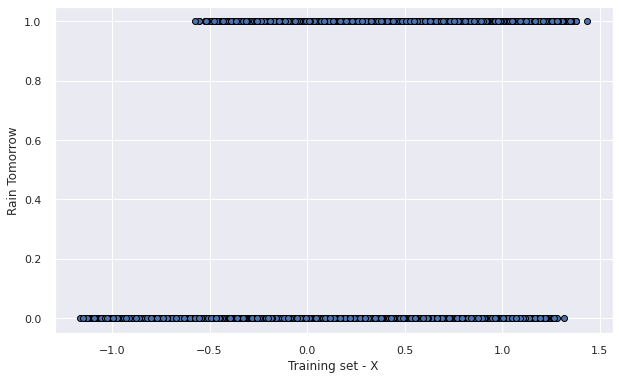

In [605]:
plt.scatter(Xtn_vis,Y_pred_train_LoR,edgecolors='black')
plt.xlabel('Training set - X')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

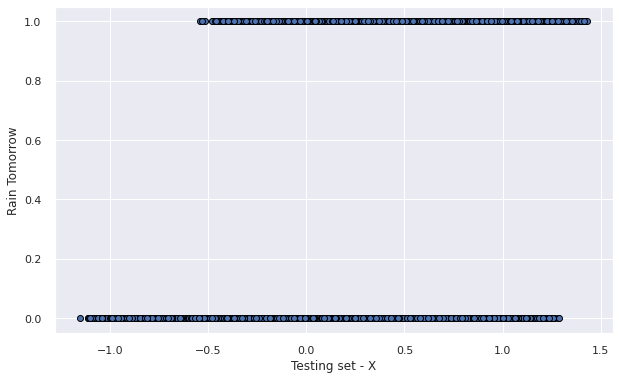

In [606]:
plt.scatter(Xtt_vis,Y_pred_test_LoR,edgecolors='black')
plt.xlabel('Testing set - X')
plt.ylabel('Rain Tomorrow')

## MODEL 2 - Linear Classifier (SGD)

### Model training

In [607]:
from sklearn.linear_model import SGDClassifier
clf = SGDClassifier()
# fit (train) the classifier
clf.fit(X_train, Y_train)

SGDClassifier()

### Evaluation Metrics

In [608]:
# print learned coeficients
print (clf.coef_)
print (clf.intercept_)

[[-0.15940726  2.22932042  0.24736289 -0.95494132 -0.07027664  4.41566545
  -0.1314699  -0.03442121 -0.90515649 -1.58187237  0.08332801  3.35413187
  -2.1707291   0.08067471  0.60555834  0.20732607  0.27967234  0.02223037
   0.05476102 -0.01864482]]
[-2.41476241]


Accuracy Score

In [609]:
#Measure accuracy on the training set
from sklearn import metrics
y_train_pred_LC = clf.predict(X_train)
print ('Model 2 Training-set accuracy score is {0:0.4f}'. format(metrics.accuracy_score(Y_train, y_train_pred_LC)))

Model 2 Training-set accuracy score is 0.8373


In [610]:
#Measure accuracy on the testing set
y_test_pred_LC = clf.predict(X_test)
print('Accuracy score for linear classifier:', metrics.accuracy_score(Y_test, y_test_pred_LC))

Accuracy score for linear classifier: 0.8352477847062685


In [611]:
print('Test set F1 score: ',f1_score(Y_test, y_test_pred_LC))

Test set F1 score:  0.5094919039642657


In [612]:
target_names = ['class 0', 'class 1']
print(metrics.classification_report(Y_test, y_test_pred_LC, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.84      0.97      0.90     33133
     class 1       0.76      0.38      0.51      9525

    accuracy                           0.84     42658
   macro avg       0.80      0.67      0.71     42658
weighted avg       0.83      0.84      0.81     42658



Confusion Matrix

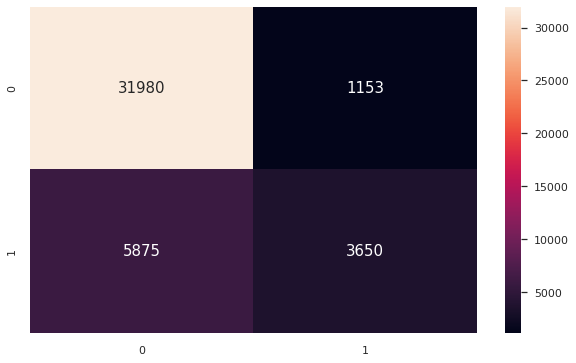

In [613]:
sns.set(rc={'figure.figsize':(10,6)})

cmLC = metrics.confusion_matrix(Y_test, y_test_pred_LC)
sns.heatmap(cmLC, annot=True, fmt='.5g', annot_kws={"size": 15})

### Visualizing plots

Observing how test features individually co-relate to the target.

Text(0, 0.5, 'Rain Tomorrow')

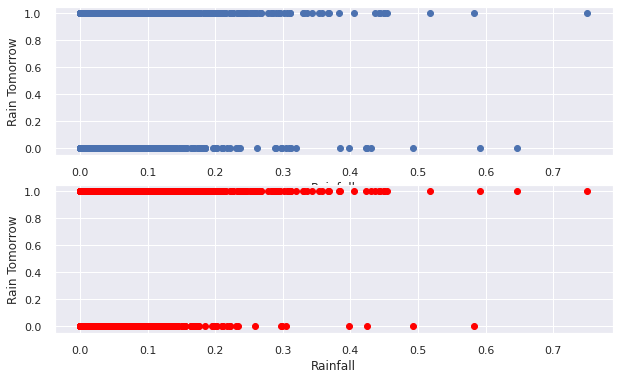

In [614]:
plt.subplot(211)
plt.scatter(X_test['Rainfall'],Y_test)
plt.xlabel('Rainfall')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Rainfall'],y_test_pred_LC,color='red')
plt.xlabel('Rainfall')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

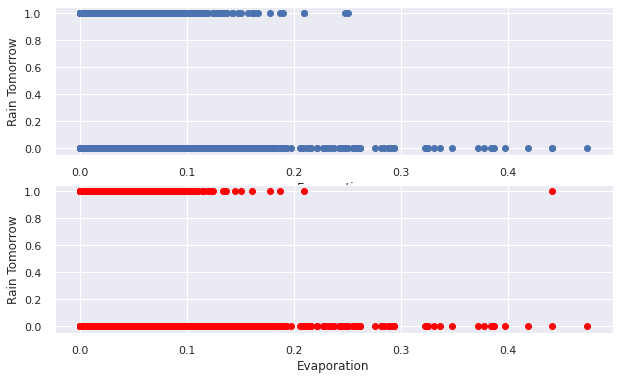

In [615]:
plt.subplot(211)
plt.scatter(X_test['Evaporation'],Y_test)
plt.xlabel('Evaporation')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Evaporation'],y_test_pred_LC,color='red')
plt.xlabel('Evaporation')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

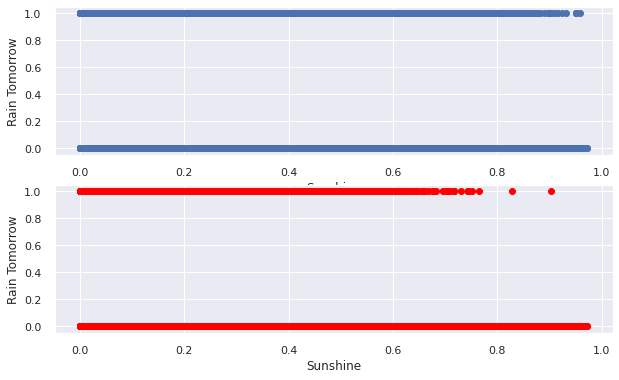

In [616]:
plt.subplot(211)
plt.scatter(X_test['Sunshine'],Y_test)
plt.xlabel('Sunshine')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Sunshine'],y_test_pred_LC,color='red')
plt.xlabel('Sunshine')
plt.ylabel('Rain Tomorrow')

Observiing model prediction

Text(0, 0.5, 'Rain Tomorrow')

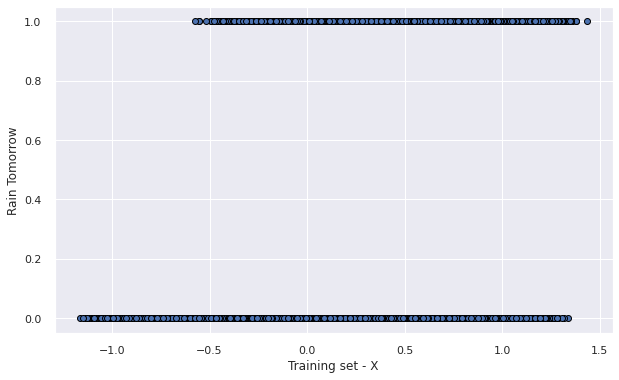

In [617]:
plt.scatter(Xtn_vis,y_train_pred_LC,edgecolors='black')
plt.xlabel('Training set - X')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

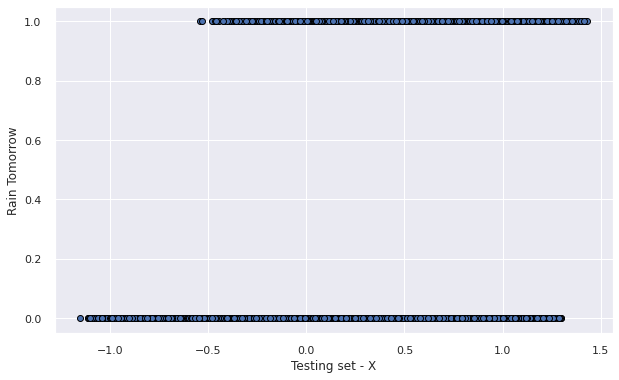

In [618]:
plt.scatter(Xtt_vis,y_test_pred_LC,edgecolors='black')
plt.xlabel('Testing set - X')
plt.ylabel('Rain Tomorrow')

## MODEL 3 - MLP classifier

### Model training

In [619]:
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(random_state=42, max_iter=100, alpha=0.0001)
mlp.fit(X_train, Y_train)
mlp.score(X_test, Y_test)

0.8476487411505462

Predicting Results

In [620]:
y_train_pred_MLP = mlp.predict(X_train)
y_test_pred_MLP = mlp.predict(X_test)

### Evaluating Results

In [621]:
mlp.score(X_test, Y_test)

0.8476487411505462

In [622]:
accuracy_score(Y_test, y_test_pred_MLP)

0.8476487411505462

In [623]:
f1_score(Y_test, y_test_pred_MLP)

0.5969112448055572

### Visualizing plots

Observing how test features individually co-relate to the target.

Text(0, 0.5, 'Rain Tomorrow')

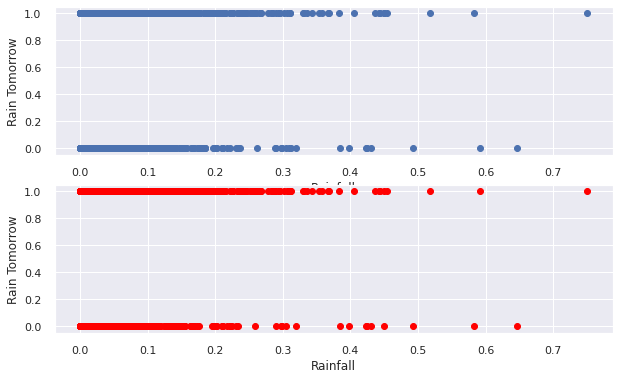

In [624]:
plt.subplot(211)
plt.scatter(X_test['Rainfall'],Y_test)
plt.xlabel('Rainfall')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Rainfall'],y_test_pred_MLP,color='red')
plt.xlabel('Rainfall')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

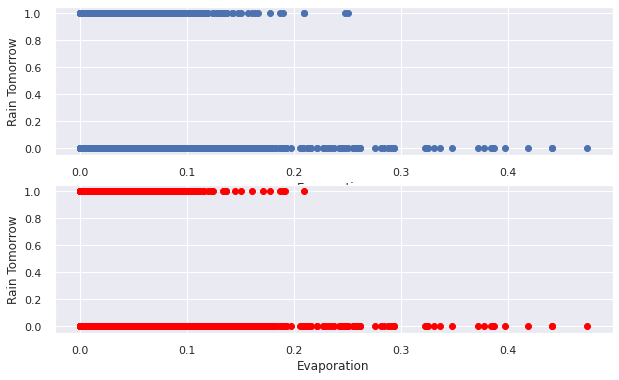

In [625]:
plt.subplot(211)
plt.scatter(X_test['Evaporation'],Y_test)
plt.xlabel('Evaporation')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Evaporation'],y_test_pred_MLP,color='red')
plt.xlabel('Evaporation')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

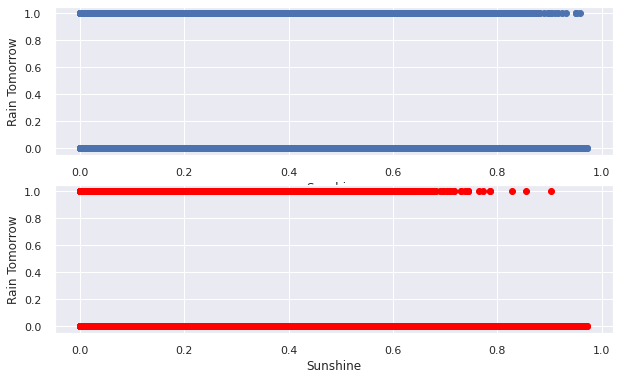

In [626]:
plt.subplot(211)
plt.scatter(X_test['Sunshine'],Y_test)
plt.xlabel('Sunshine')
plt.ylabel('Rain Tomorrow')
plt.subplot(212)
plt.scatter(X_test['Sunshine'],y_test_pred_MLP,color='red')
plt.xlabel('Sunshine')
plt.ylabel('Rain Tomorrow')

Observiing model prediction

Text(0, 0.5, 'Rain Tomorrow')

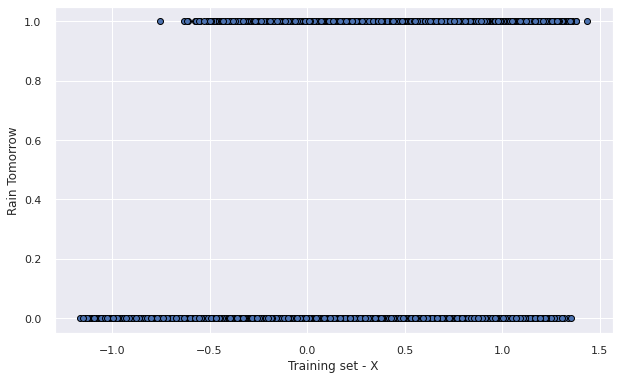

In [627]:
plt.scatter(Xtn_vis,y_train_pred_MLP,edgecolors='black')
plt.xlabel('Training set - X')
plt.ylabel('Rain Tomorrow')

Text(0, 0.5, 'Rain Tomorrow')

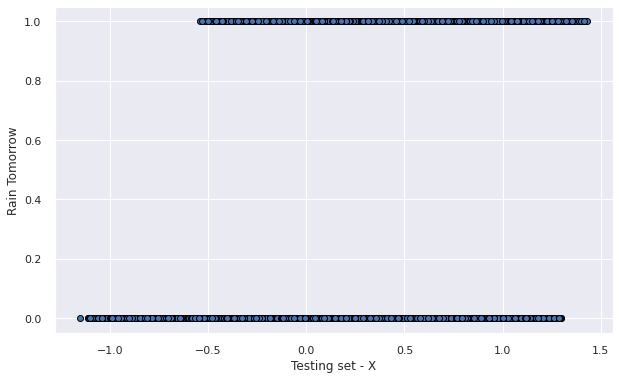

In [628]:
plt.scatter(Xtt_vis,y_test_pred_MLP,edgecolors='black')
plt.xlabel('Testing set - X')
plt.ylabel('Rain Tomorrow')

# COMPARING SUPERVISED MODELS

In [629]:
from tabulate import tabulate
tup = {'Logistic Reg': [accuracy_score(Y_test, Y_pred_test_LoR),f1_score(Y_test, Y_pred_test_LoR), precision_score(Y_test,Y_pred_test_LoR), recall_score(Y_test,Y_pred_test_LoR)],
       'Linear Classifier': [metrics.accuracy_score(Y_test, y_test_pred_LC),f1_score(Y_test, y_test_pred_LC), precision_score(Y_test,y_test_pred_LC), recall_score(Y_test,y_test_pred_LC)],
       'MLP Classifier': [accuracy_score(Y_test, y_test_pred_MLP),f1_score(Y_test, y_test_pred_MLP), precision_score(Y_test,y_test_pred_MLP), recall_score(Y_test,y_test_pred_MLP)]}
csm = pd.DataFrame(tup)
csm = csm.rename(index={0: 'Accuracy Score', 1: 'F1 Score', 2: 'Precision', 3: 'Recall'})
csm.style.highlight_max(axis='columns',color='magenta')

,Logistic Reg,Linear Classifier,MLP Classifier
Accuracy Score,0.839116,0.835248,0.847649
F1 Score,0.571143,0.509492,0.596911
Precision,0.705465,0.759942,0.729312
Recall,0.479790,0.383202,0.505197


* Here in our problem, cost of False +ve is less than the cost of False -ve, we will go with F1 score as the deciding measure to select our classifier model.

* MLP Classifier seems to be performing best.

Now running the ensemble

In [630]:
pred_1 = logreg.predict(X_test)
pred_2 = clf.predict(X_test)
pred_3 = mlp.predict(X_test)
 
# final prediction after averaging on the prediction of all 3 models
pred_final = (pred_1+pred_2+pred_3)/3.0
pred_final = np.where(pred_final > 0.5, 1, 0)
print(metrics.accuracy_score(Y_test, pred_final))
print(f1_score(Y_test, pred_final))

0.8419288292934503
0.5593098490294752


# Unsupervised Modeling

## K-Means Clustering

k-means clustering to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean.

In [631]:
# Import module
from sklearn import cluster
from sklearn.cluster import KMeans

# Scaling features
Xk = scaler.fit_transform(X) # Already have segregated the features from the target
Xk = pd.DataFrame(X_train_, columns=[cols])

To find n : Since this is a classification problem where we have two classes, we will take n = 2 for the clustering.

In [632]:
# Import module
from sklearn.metrics import silhouette_score

# Applying KMeans with 2 clusters
km = KMeans(n_clusters=2).fit(Xk)
Silhouette_Score = silhouette_score(Xk, km.labels_)
print('Silhouette Score: %.5f' % Silhouette_Score)

Silhouette Score: 0.22253


We have a Silhouette Score of 0.12639. Our clusters are not overlapping.

Let's look into it deepy and compare the Silhouette Score for n different no. of clusters

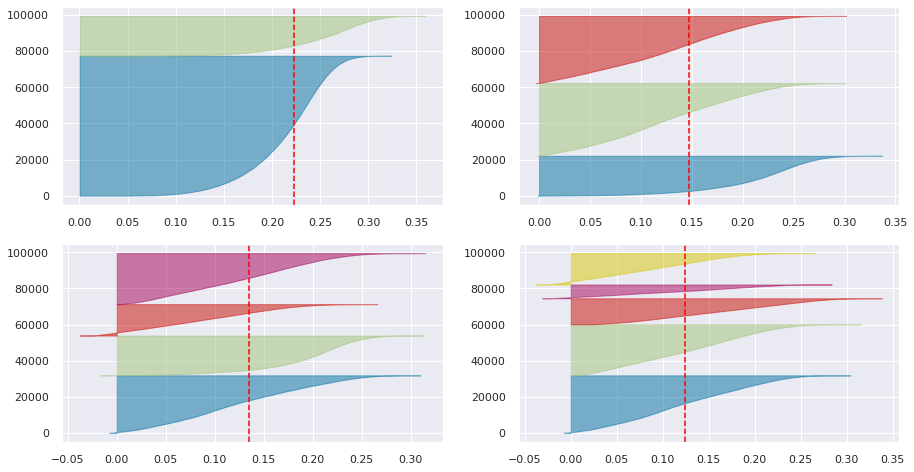

In [659]:
from yellowbrick.cluster import SilhouetteVisualizer
 
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km1 = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km1, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(Xk) 

The value of n_clusters as 2 looks to be optimal for the given data due to the following reasons:
* No presence of clusters with below average silhouette scores.
* No wide fluctuations in the size of the silhouette plots.
* The thickness of the silhouette plot representing each cluster is similarily uniform.

## Visualizing Clusters

In [634]:
# Labels

label = km.labels_
print(np.unique(label))

[0 1]


### 2D

In [635]:
# Define pca1 - X1
pca1 = PCA(2)
X1 = pca1.fit_transform(Xk)

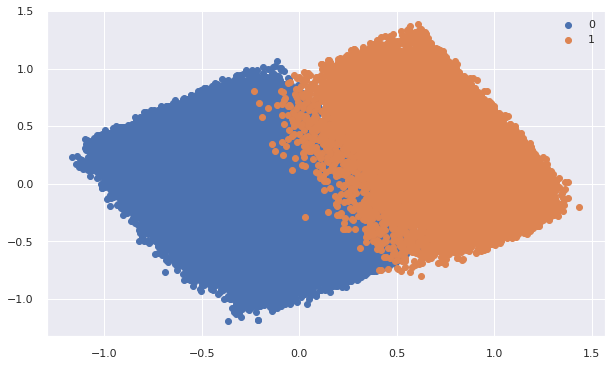

In [636]:
#Getting the Centroids
centroids = km.cluster_centers_
u_labels = np.unique(label)
 
#plotting the results:

for i in u_labels:
    plt.scatter(X1[label == i , 0] , X1[label == i , 1] , label = i)
#plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

### 3D

In [637]:
# Define pca2 - X
pca2 = PCA(n_components=3, random_state=42)
X2 = pca2.fit_transform(Xk)

In [638]:
# Make dataframe for visualization
X_df = pd.DataFrame(X2, columns = ['col1','col2','col3'])

# Merge dataframe with KMeans 2 clusters
lab = km.labels_
X_df['lab'] = lab

In [639]:
# Show X_df head
X_df.head()

,col1,col2,col3,lab
0,-0.472260,-0.316731,0.402914,0
1,0.207966,-0.723132,-0.153904,0
2,0.574929,-0.023435,0.584812,1
3,-0.575573,0.408424,0.149816,0
4,-0.386094,-0.231175,0.076300,0


In [640]:
# Change 'labels' to string
X_df['lab'] = X_df['lab'].astype(str)

In [641]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

In [642]:
# Import module
import plotly.offline as pyo
import plotly.express as px
pyo.init_notebook_mode()
# Visualization the result
fig = px.scatter_3d(X_df, x='col1', y='col2', z='col3',
              color=X_df['lab'])
fig.show(renderer="colab")

From this 3D figure, we can say that it gave us a nearly perfect classification.

## Regression on K-Means labels - Unsupervised-Supervised Ppeline Analysis / K-Meeans - Linear Classifier

In [643]:
lab = km.labels_
Xt = Xk

In [644]:
labt = pd.DataFrame(lab)
labt.columns = ['Labels']
labt.head()

,Labels
0,0
1,0
2,1
3,0
4,0


Spliting the cluster results to test and training sets

In [645]:
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(Xt, labt, test_size = 0.3, random_state = 42)

Training Linear Classifier on the cluster results

In [646]:
clf_t = SGDClassifier()
# fit (train) the classifier
clf_t.fit(X_train_t, y_train_t)

SGDClassifier()

Now, let's try predicting results on test values from the testing set derived from the k-means clusters.

In [647]:
pred_1_e12 = clf_t.predict(X_test_t)

In [648]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_t, pred_1_e12)

print ("Confusion Matrix : \n", cm)

from sklearn.metrics import accuracy_score
print ("Accuracy : ", accuracy_score(y_test_t, pred_1_e12))


Confusion Matrix : 
 [[23327     0]
 [    0  6534]]
Accuracy :  1.0


Here we see that we have achieved a 100% accuracy which is really bad, this is a extreme case of overfitting.

We got this result because we trained the classifier on k-means which already gave us nearly perfect clusters (clssification)

Predicting results on test values from the testing set derived directly from the original dataset

In [649]:
pred_1_e = clf_t.predict(X_test) # not X_test_t
pred_2_e = km.predict(X_test)
 
# final prediction after averaging on the prediction of all 2 models
pred_final_e = (pred_1_e+pred_2_e)/2.0
pred_final_e

array([1., 0., 0., ..., 0., 0., 1.])

In [650]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_test, pred_final)

print ("Confusion Matrix : \n", cm)

from sklearn.metrics import accuracy_score
print ("Accuracy : ", accuracy_score(Y_test, pred_final))


Confusion Matrix : 
 [[31636  1497]
 [ 5246  4279]]
Accuracy :  0.8419288292934503


As we can see that after training the Linear Classifier on the results of K-means (which gave us nearly perfect clusters), we have similar result.

## Unsupervised-Supervised Ppeline Analysis / MiniSom - Logistic Reg

In [651]:
!pip install minisom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [652]:
XC = X_train.values
YC = Y_train.values
XM = X_test.values
YM = Y_test.values

In [653]:
from minisom import MiniSom
som_model=MiniSom(10,10,20,sigma=0.4, learning_rate=0.2)

som_model.train(XC, 50000, verbose=True)

 [ 50000 / 50000 ] 100% - 0:00:00 left 
 quantization error: 0.7455492878905736


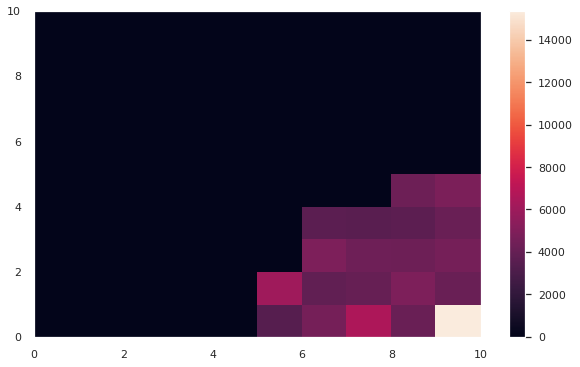

In [654]:
activation=som_model.activation_response(XC)
plt.pcolor(activation.T) 
plt.colorbar()
plt.show()

In [655]:
X_training_qnt=som_model.quantization(XC)

In [656]:
LGR_model_2nd_layer = LogisticRegression(max_iter=1000)
LGR_model_2nd_layer.fit(X_training_qnt,YC)
LGR_model_2nd_layer_prediction=LGR_model_2nd_layer.predict(som_model.quantization(XM))

In [657]:
print('Accuracy: ',accuracy_score(YM,LGR_model_2nd_layer_prediction))
print('f1_score: ', f1_score(YM,LGR_model_2nd_layer_prediction,average='weighted'))
print('Precision: ', precision_score(YM,LGR_model_2nd_layer_prediction,average='weighted'))
print('Recall: ', recall_score(YM,LGR_model_2nd_layer_prediction,average='weighted'))

Accuracy:  0.7779314548267617
f1_score:  0.7279771506047759
Precision:  0.7327662814913223
Recall:  0.7779314548267617


Here we can see that our ensemble is not performing better than the supervied machine learning models

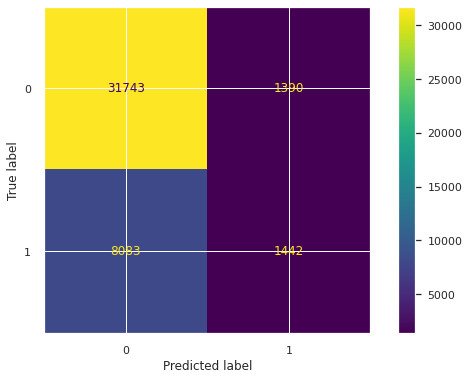

In [658]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(LGR_model_2nd_layer,som_model.quantization(XM),YM)

Of all the models we have tried,

I could also go with the K-Means clustering, because I can use k-means as a classification model by setting no. of clusters equal to the no. of labels in the target variable (here 2). Also, after removing the correlated featues for this problem, we can have better cluster distinction.

Among supervised learning models, MLP seemed to be performing the best.

## SOM - MLP

In [660]:
MLP_model_2nd_layer = MLPClassifier(random_state=42, max_iter=1000, alpha=0.0001)
MLP_model_2nd_layer.fit(X_training_qnt,YC)
MLP_model_2nd_layer_prediction=MLP_model_2nd_layer.predict(som_model.quantization(XM))

In [661]:
print('Accuracy: ',accuracy_score(YM,MLP_model_2nd_layer_prediction))
print('f1_score: ', f1_score(YM,MLP_model_2nd_layer_prediction,average='weighted'))
print('Precision: ', precision_score(YM,MLP_model_2nd_layer_prediction,average='weighted'))
print('Recall: ', recall_score(YM,MLP_model_2nd_layer_prediction,average='weighted'))

Accuracy:  0.7779314548267617
f1_score:  0.7279771506047759
Precision:  0.7327662814913223
Recall:  0.7779314548267617


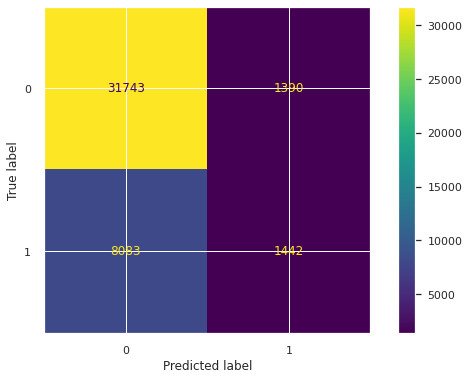

In [662]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(LGR_model_2nd_layer,som_model.quantization(XM),YM)

Here we can see that MiniSom - MLP also doesn't give more improvement.

Again, of all the models we have tried,

I could also go with the K-Means clustering, because I can use k-means as a classification model by setting no. of clusters equal to the no. of labels in the target variable (here 2). Also, after removing the correlated featues for this problem, we can have better cluster distinction.

Among Supervised learning models - MLP performed the best.

# FIN